In [3]:
import geopandas
noneuc = geopandas.read_file("Non_Eucalyptus_Reg_Ecos/Non_Eucalypt_RE.shp")
euc = geopandas.read_file("FF_SingleSp_RE_2017_V11.shp")

ucl = euc['QLD_REG_EC'].unique().tolist()
euco = {k: v for v, k in enumerate(ucl)}

nonucl = noneuc['RE'].unique().tolist()
noneuco = {k: v for v, k in enumerate(nonucl)}

zg = {**euco, **noneuco}
import copy
zgz = copy.deepcopy(zg)
counter = 10
zk = list(zgz.keys())
for p in range(0,len(zgz)):
    zgz[zk[p]] = counter
    counter += 1

ready...
ready...
reflectance tif exists
/Users/brian/code/FloweringPolygons/herberton/eeb250b5-3779-41bf-9212-3c2d91780b75/2/files/20181204_000533_1044_3B_AnalyticMS_clip_reflectance.bil


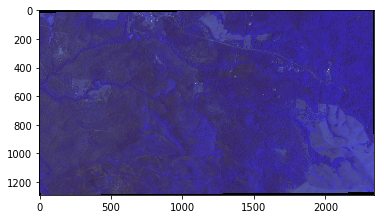

In [1]:
%run create_training_polygons
%run filmstrip
hsf7 = '/Users/brian/code/FloweringPolygons/herberton/eeb250b5-3779-41bf-9212-3c2d91780b75/2/files/20181204_000533_1044_3B_AnalyticMS_clip.tif'
hspy7 = dir2spyref(hsf7)
u = imshow(hspy7)
#view = imshow(hspy7, (2, 1, 0), classes=hnon,colors=spy_colors,figsize=(20,20))
#view.set_display_mode('overlay')
#view.class_alpha = 0.5

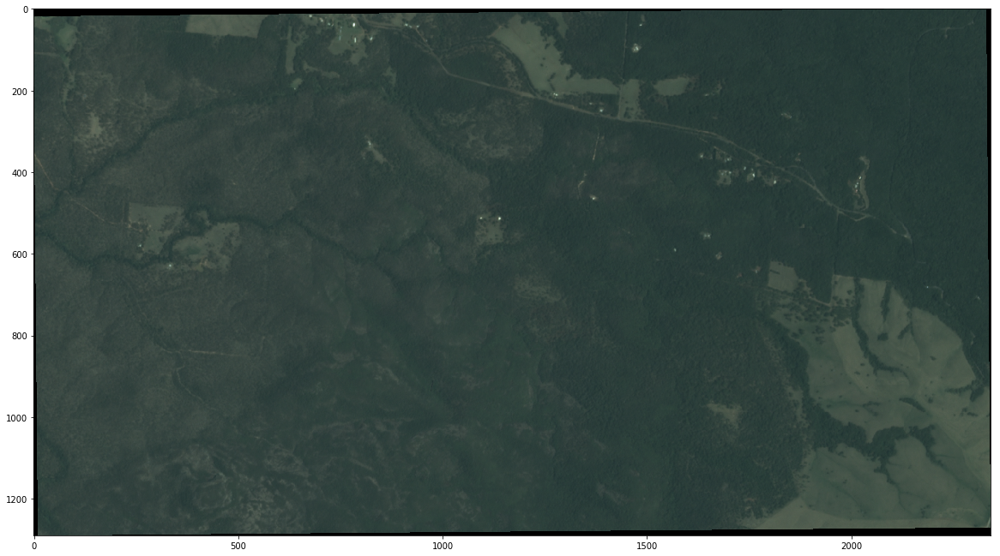

In [91]:
view = imshow(hspy7, (2, 1, 0), figsize=(20,20))

ready...
------src.ref_____
+init=epsg:32755
---------lbrt-------------
331488.0 8066703.0 338514.0 8070573.0
---------spoly-------------
POLYGON ((331488 8070573, 331488 8066703, 338514 8066703, 338514 8070573, 331488 8070573))
image pixel dimensions:
(1290, 2342, 4)
xpoly.bounds: (331488.0, 8066703.0, 338514.0, 8070573.0)
chd:3870.0 cwd:7026.0
0


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2821: DtypeWarning: Columns (13,14,15,16,17,18,21,22,23,24,26,27,28,29,30,31,32,33,34,37,50,54,56,58,60,61,62,64,70,71,83,84,85) have mixed types. Specify dtype option on import or set low_memory=False.
  if self.run_code(code, result):


7.12.63
Eucalyptus moluccana (gum-topped box) woodland. Granite and rhyolite. (BVG1M: 13d)
2
(331990.85175533395, 8068578.317993321, 332124.1094413574, 8068727.734653956)
cl  167.61725177798263   212.0364804524579
7.12.63
Eucalyptus moluccana (gum-topped box) woodland. Granite and rhyolite. (BVG1M: 13d)
2
(331502.37175918487, 8068726.014931146, 332131.0486209848, 8069390.180732183)
cl  4.790586394956335   214.34954032825772
7.12.63
Eucalyptus moluccana (gum-topped box) woodland. Granite and rhyolite. (BVG1M: 13d)
2
(331571.7535852735, 8069187.771321242, 332533.4867465525, 8069889.725870214)
cl  27.917861757838786   348.49558218417224
7.12.21a
Eucalyptus grandis tall open forest and woodland. Granites and rhyolites.  (BVG1M: 8a)

2
(336154.8317567634, 8066745.1315820655, 336549.37765208445, 8067474.384019949)
cl  1555.6105855877977   1687.1258840281516
7.12.21a
Eucalyptus grandis tall open forest and woodland. Granites and rhyolites.  (BVG1M: 8a)

2
(336196.0142271946, 8067541.789325057

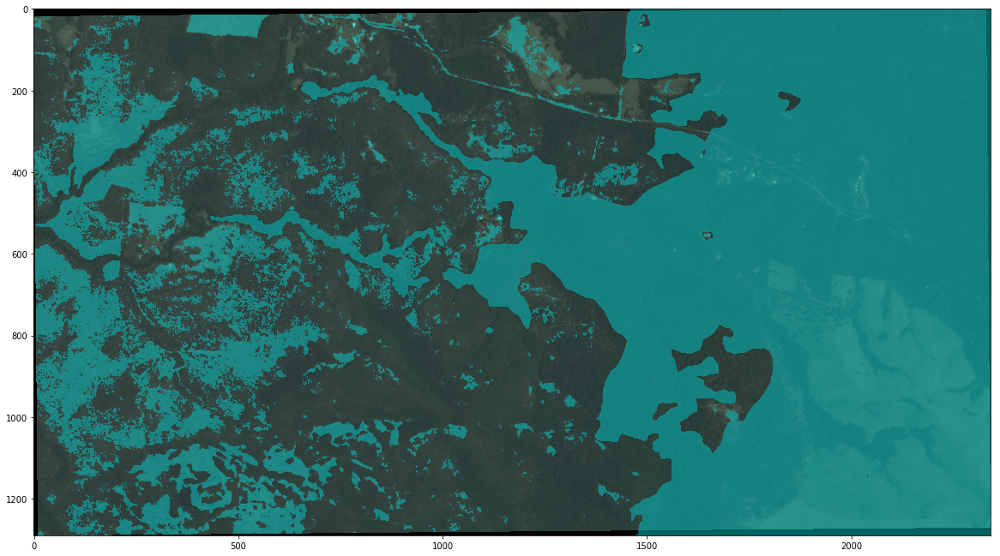

In [5]:
#result.to_csv('sub2polyNE.csv')
%run create_training_polygons
hnon = xkPolyNon(hsf7,hspy7,8,'sub2polyNE.csv',4326,4283,32755,0,2231,0,2140,zgz)

view = imshow(hspy7, (2, 1, 0), classes=hnon,figsize=(20,20))
view.set_display_mode('overlay')
view.class_alpha = 0.5

In [6]:
#result.to_csv('sub2polyNE.csv')
#%run create_training_polygons
#hnonf = xkPolyNon(hsf7,hspy7,8,'herbfullpoly.csv',4326,4283,32755,0,2231,0,2140,zgz)

#view = imshow(hspy7, (2, 1, 0), classes=hnonf,figsize=(20,20))
#view.set_display_mode('overlay')
#view.class_alpha = 0.5

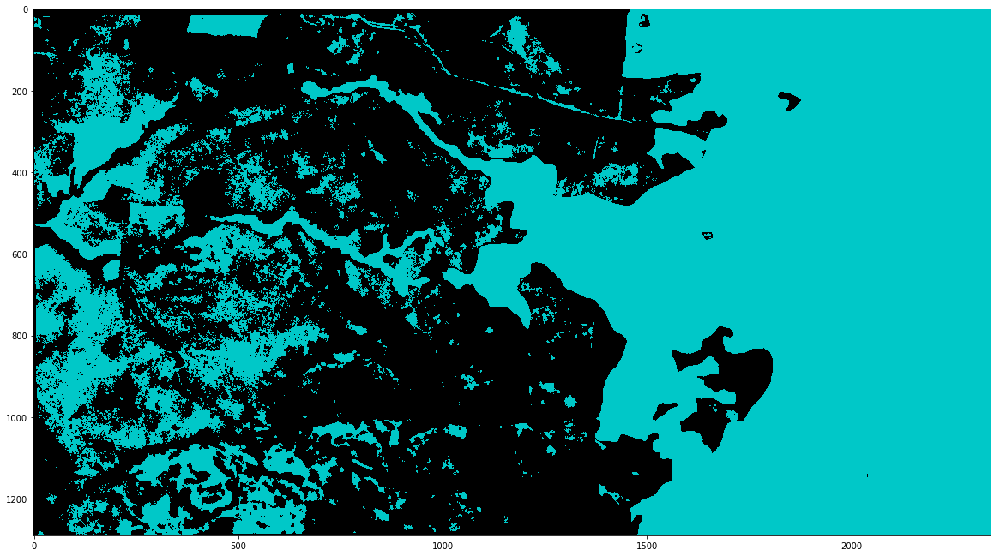

In [54]:
v = imshow(classes=hnon,figsize=(20,20))

In [55]:
np.unique(hnon)

array([ 0.,  2.,  3.,  5.])

In [68]:
hnon2 = hnon[hnon==2.0]
len(hnon2)
find_index = np.where(hnon==2)
index =  np.asarray(find_index).T

In [69]:
hnon2c = np.copy(hnon[index, ])

IndexError: index 1461 is out of bounds for axis 0 with size 1290

In [61]:
hnon.ndim

2

In [62]:
hnon.shape

(1290, 2342)

In [66]:
hnon2[3]

2.0

In [7]:
type(hnon)

numpy.ndarray

In [ ]:
todo = "We must write hnon to file, and make it re-loadable, it is too costly to re-calculate"

In [8]:
#np.save('hnon.npy', hnon) # save


In [7]:
import numpy as np
hnon = np.load('hnon.npy') # load

In [6]:
#import spectral as spy
#traincl8f = spy.create_training_classes(hspy7,hnonf)
#gmlcwp8f = GaussianClassifier(traincl8f)
#clmapwp8f = gmlcwp8f.classify_image(hspy7)
#imshow(classes=clmapwp8f,figsize=(20,20))
#gtresults8f = clmapwp8f * (hnonf != 0)
#v = imshow(classes=gtresults8f,figsize=(20,20))

Setting min samples to 4
Covariance.....  0.0%Covariance.....  0.0%Covariance.....done  
Covariance.....  0.0%Covariance.....  0.0%Covariance.....done  
Covariance.....  0.0%Covariance.....  0.0%Covariance.....done  
Classifying image...  0.0%Classifying image...done  


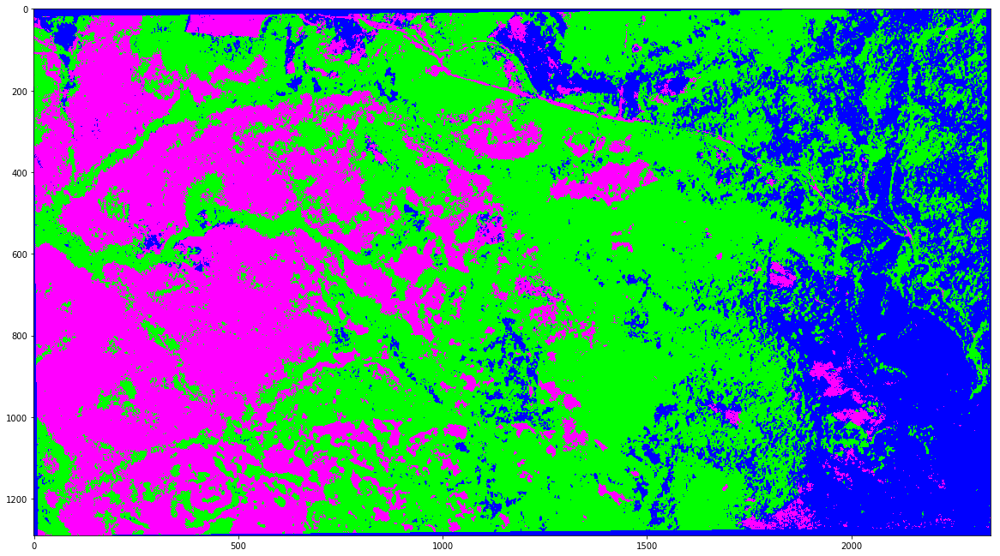

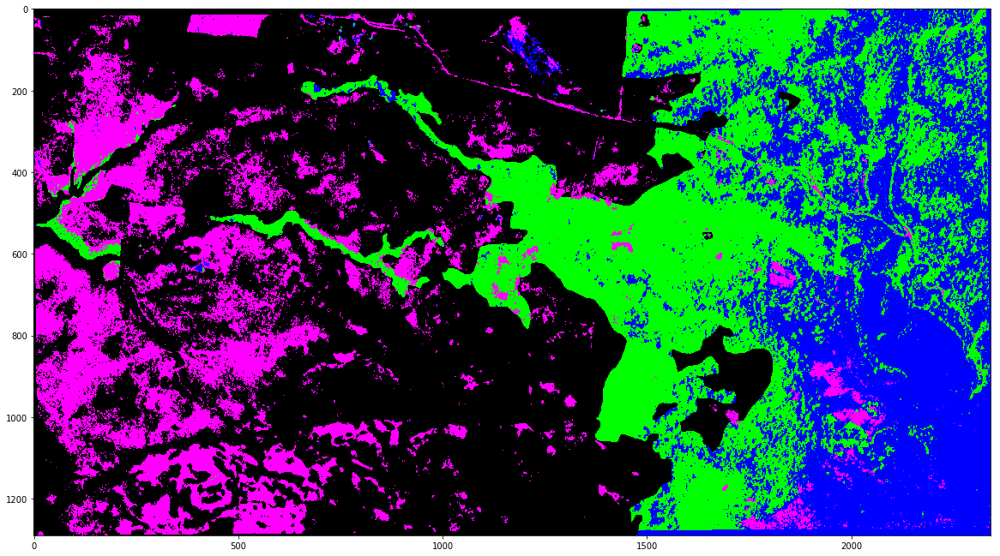

In [8]:
import spectral as spy
traincl8 = spy.create_training_classes(hspy7,hnon)
gmlcwp8 = GaussianClassifier(traincl8)
clmapwp8 = gmlcwp8.classify_image(hspy7)
imshow(classes=clmapwp8,figsize=(20,20))
gtresults8 = clmapwp8 * (hnon != 0)
v = imshow(classes=gtresults8,figsize=(20,20))
# traincl8
# clmapwp8


ImageView object:
  Interpolation       :  <default>

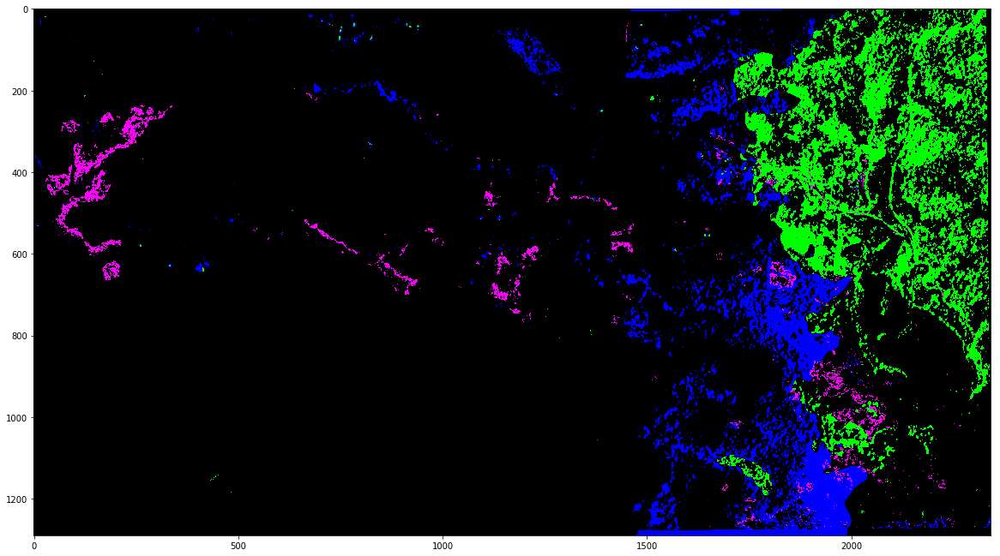

In [9]:
training_errors = gtresults8 * (gtresults8 != hnon)
imshow(classes=training_errors,figsize=(20,20))

In [13]:
type(traincl8)
np.save('clmapwp.npy', tra) 

spectral.algorithms.algorithms.TrainingClassSet

In [12]:
type(clmapwp8)

numpy.ndarray

In [14]:
type(gtresults8)

numpy.ndarray

In [16]:
np.save('clmapwp.npy', clmapwp8) # save
np.save('gtresults8.npy', gtresults8) # save

In [18]:
import pickle
fh = open( "traincl8.p", "wb" )
pickle.dump( traincl8, fh )

TypeError: cannot serialize '_io.BufferedReader' object

In [ ]:
traincl8 = pickle.load( open( "traincl8.p", "rb" ) )

In [ ]:
gmlcwp8.classify_spectrum(0)

In [ ]:
np.unique(hnon,return_counts=True)

In [ ]:
np.unique(gtresults8,return_counts=True)

In [ ]:
# you set 2, 3, 5:
# 2 - Euc
# 3 - Non Euc
# 5 - NonVeg
hnon.shape

In [8]:
import pandas as pd
y_actu = pd.Series(hnon.flatten(), name='Actual')
y_pred = pd.Series(gtresults8.flatten(), name='Predicted')
df_confusion = pd.crosstab(y_actu, y_pred)

In [9]:
df_confusion

Predicted,0,2,3,5
Actual,,,,
0.0,1398371,0,0,0
2.0,0,462309,124980,24849
3.0,0,177962,410243,6365
5.0,0,982,8743,406376


In [10]:
df_confusion_c = pd.crosstab(y_actu, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=True)


In [11]:
df_confusion_c

Predicted,0,2,3,5,All
Actual,,,,,
0.0,1398371,0,0,0,1398371
2.0,0,462309,124980,24849,612138
3.0,0,177962,410243,6365,594570
5.0,0,982,8743,406376,416101
All,1398371,641253,543966,437590,3021180


In [20]:
    def classify_image_wp(self, image):
        '''Classifies an entire image, returning a classification map.
        Arguments:
            `image` (ndarray or :class:`spectral.Image`)
                The `MxNxB` image to classify.
        Returns (ndarray):
            An `MxN` ndarray of integers specifying the class for each pixel.
        '''
        import math
        import spectral
        self.cache_class_scores = True
        #if not (self.cache_class_scores and isinstance(image, np.ndarray)):
        #    return super(GaussianClassifier, self).classify_image(image)

        status = spectral._status
        status.display_percentage('Processing...')
        shape = image.shape
        image = image.reshape(-1, shape[-1])
        scores = np.empty((image.shape[0], len(self.classes)), np.float64)
        delta = np.empty_like(image, dtype=np.float64)

        # For some strange reason, creating Y with np.emtpy_like will sometimes
        # result in the following error when attempting an in-place np.dot:
        #     ValueError: output array is not acceptable (must have the right
        #     type, nr dimensions, and be a C-Array)
        # It appears that this may be happening when delta is not contiguous,
        # although it isn't clear why the alternate construction of Y below
        # does work.
        Y = np.empty_like(delta)

        for (i, c) in enumerate(self.classes):
            scalar = math.log(c.class_prob) - 0.5 * c.stats.log_det_cov
            delta = np.subtract(image, c.stats.mean, out=delta)
            try:
                Y = delta.dot(-0.5 * c.stats.inv_cov, out=Y)
            except:
                # Unable to output np.dot to existing array. Allocate new
                # storage instead. This will not affect results but may be
                # slower.
                Y = delta.dot(-0.5 * c.stats.inv_cov)
            scores[:, i] = np.einsum('ij,ij->i', Y, delta)
            scores[:, i] += scalar
            print(scores.shape)
            status.update_percentage(100. * (i + 1) / len(self.classes))
            print(c)
        status.end_percentage()
        inds = np.array([c.index for c in self.classes], dtype=np.int16)
        mins = np.argmax(scores, axis=-1)
        #return inds[mins].reshape(shape[:2])
        return scores

In [21]:
    def classify_spectrum_ws(self, x):
        '''
        Classifies a pixel into one of the trained classes.
        Arguments:
            `x` (list or rank-1 ndarray):
                The unclassified spectrum.
        Returns:
            `classIndex` (int):
                The index for the :class:`~spectral.algorithms.TrainingClass`
                to which `x` is classified.
        '''
        from math import log

        scores = np.empty(len(self.classes))
        for (i, cl) in enumerate(self.classes):
            delta = (x - cl.stats.mean)
            scores[i] = log(cl.class_prob) - 0.5 * cl.stats.log_det_cov \
               - 0.5 * delta.dot(cl.stats.inv_cov).dot(delta)
        #return self.classes[np.argmax(scores)].index
        return scores

In [101]:
import spectral# as spy
image = hspy7
#from spy.algorithms import ImageIterator
from numpy import zeros
status = spectral._status
status.display_percentage('Classifying image...')
it = spectral.algorithms.ImageIterator(image)
class_map = zeros(image.shape[:2], np.int16)
score_map1 = zeros(image.shape[:2], np.int16)
score_map2 = zeros(image.shape[:2], np.int16)
score_map3 = zeros(image.shape[:2], np.int16)
N = it.get_num_elements()
i, inc = (0, N / 100)
storn = []
for spectrum in it:
    #print(classify_spectrum_ws(gmlcwp8,spectrum))
    stor = classify_spectrum_ws(gmlcwp8,spectrum)
    
    if not i % 100000:
        #print(spectrum)
        print(stor)
    #class_map[it.row, it.col] = classify_spectrum_ws(gmlcwp8,spectrum)
    score_map1[it.row, it.col] = stor[0]
    score_map2[it.row, it.col] = stor[1]
    score_map3[it.row, it.col] = stor[2]
    storx = [0,0,0]
    storx[0] = abs(stor[0])
    storx[1] = abs(stor[1])
    storx[2] = abs(stor[2])
    storn.append(storx)
    i += 1
    if not i % inc:
        status.update_percentage(float(i) / N * 100.)
        status.end_percentage()

Classifying image...  0.0%[ -52.93646515  -44.72157128 -273.91868976]
[-23.80097123 -23.59235537 -81.96339354]
[-28.64414729 -33.43399484 -23.00974361]
[-25.17130849 -27.62407464 -22.52352563]
[-24.42635542 -24.08942169 -90.7366444 ]
[-24.23694278 -27.81894531 -29.78721283]
[-30.48595637 -34.7769114  -24.14033208]
[-24.52914395 -24.39998115 -83.90729734]
[-24.97268448 -28.71346031 -23.42765898]
[-25.89661261 -30.38007916 -22.06289389]
[-24.11556708 -24.15571978 -76.04566218]
[-24.42052334 -25.27005624 -61.38596478]
[-27.01284937 -31.77933792 -24.74022538]
[-26.6455154  -30.39549303 -23.18219263]
[-23.28970975 -24.22518069 -57.07484334]
[-25.4082672  -29.9603681  -33.81483482]
[-30.59342567 -35.87091359 -26.59071347]
[-30.75377094 -25.0747492  -39.95933258]
[-25.67012133 -31.03401498 -23.59832456]
[-29.04275697 -36.17497322 -23.03547791]
[-32.29717313 -25.683891   -51.98274263]
[-23.02191101 -24.06390968 -56.99670752]
[-23.24358858 -25.16267888 -37.01364814]
[-27.90350928 -33.47569368 -

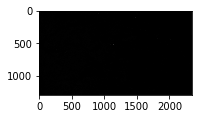

In [14]:
score_map1
import matplotlib.pyplot as plt
import matplotlib.cm as cm
fig = plt.figure()
ax1 = fig.add_subplot(121)
ax1.imshow(abs(score_map2), interpolation='nearest', cmap=cm.Greys_r)
plt.show() 

In [81]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def plot(image, w=30, h=24, cmap='jet'):
    f, ax = plt.subplots(1, figsize=(w,h))
    ax.axis('off')
    plt.imshow(image, cmap=cmap)
    plt.colorbar()
    plt.show()
    
def climplot(image,lower,upper, w=30, h=24,  cmap='jet'):
    f, ax = plt.subplots(1, figsize=(w,h))
    ax.axis('off')
    plt.imshow(image, cmap=cmap)
    plt.colorbar()
    plt.clim(lower, upper)
    plt.show()


# Eucalyptus-NonVegetation nLL difference

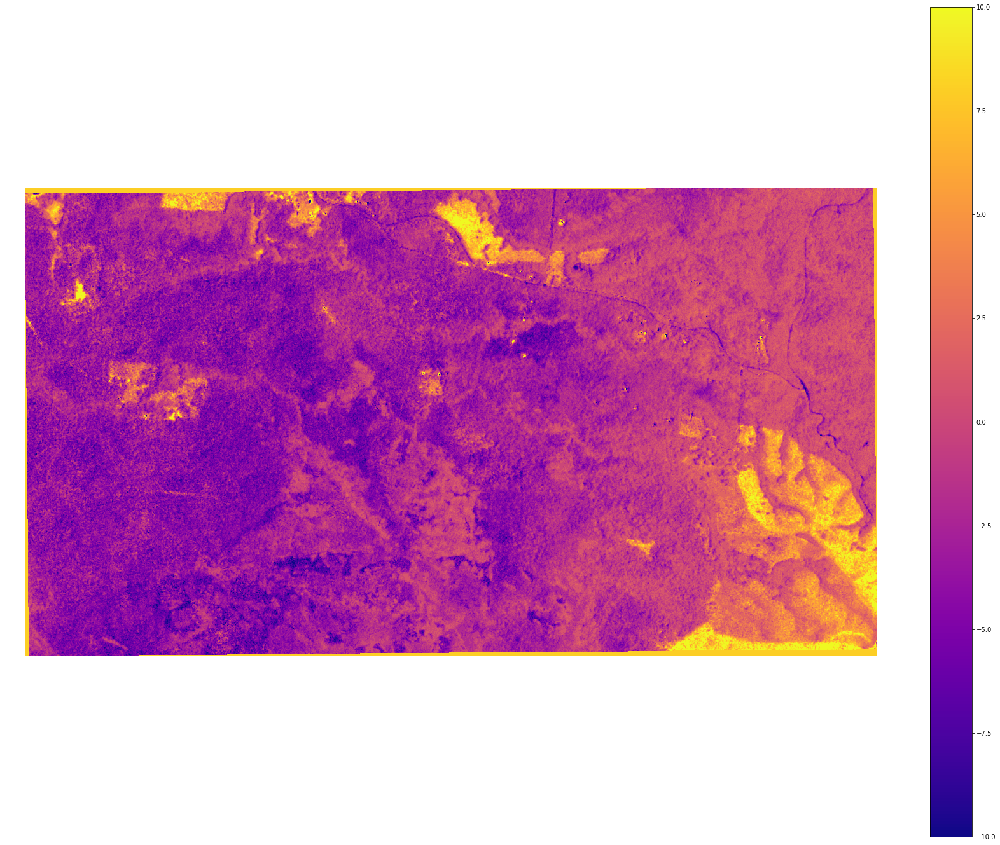

In [137]:
climplot(abs(score_map1)-abs(score_map2),lower=-10,upper=10,cmap="plasma")

# Eucalyptus-NonVegetation nLL difference

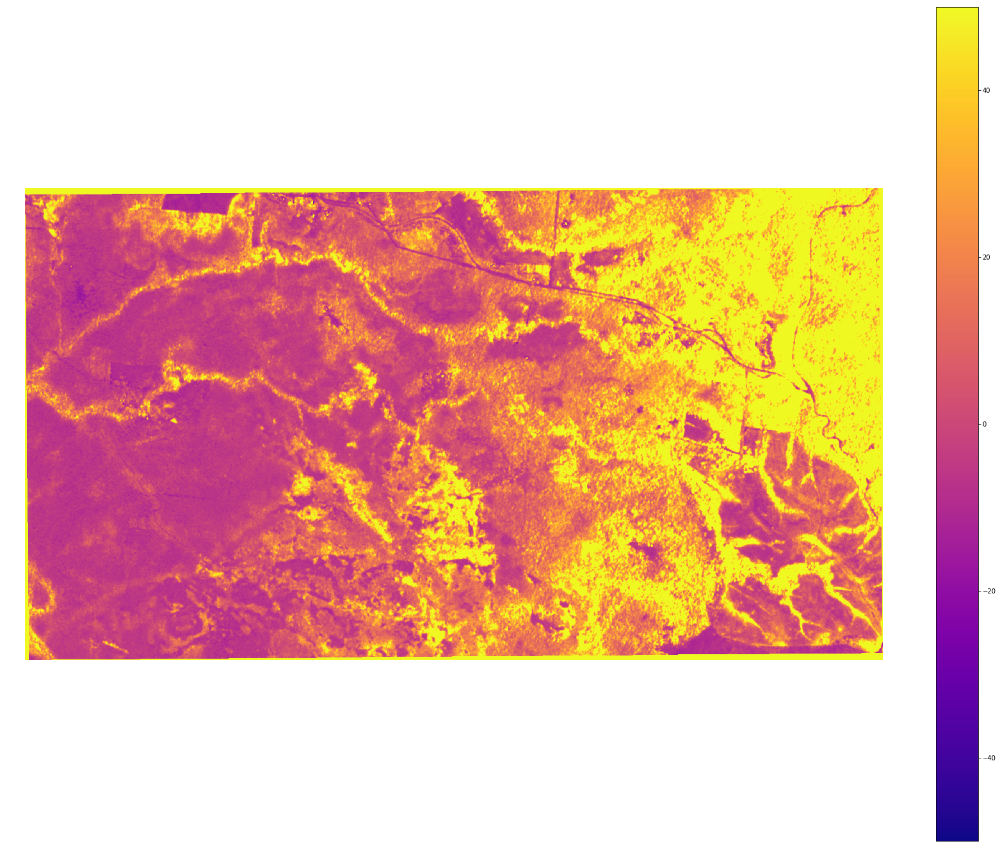

In [112]:
climplot(abs(score_map3)-abs(score_map1),lower=-50,upper=50,cmap="plasma")

# NonEucalyptus-NonVegetation nLL difference

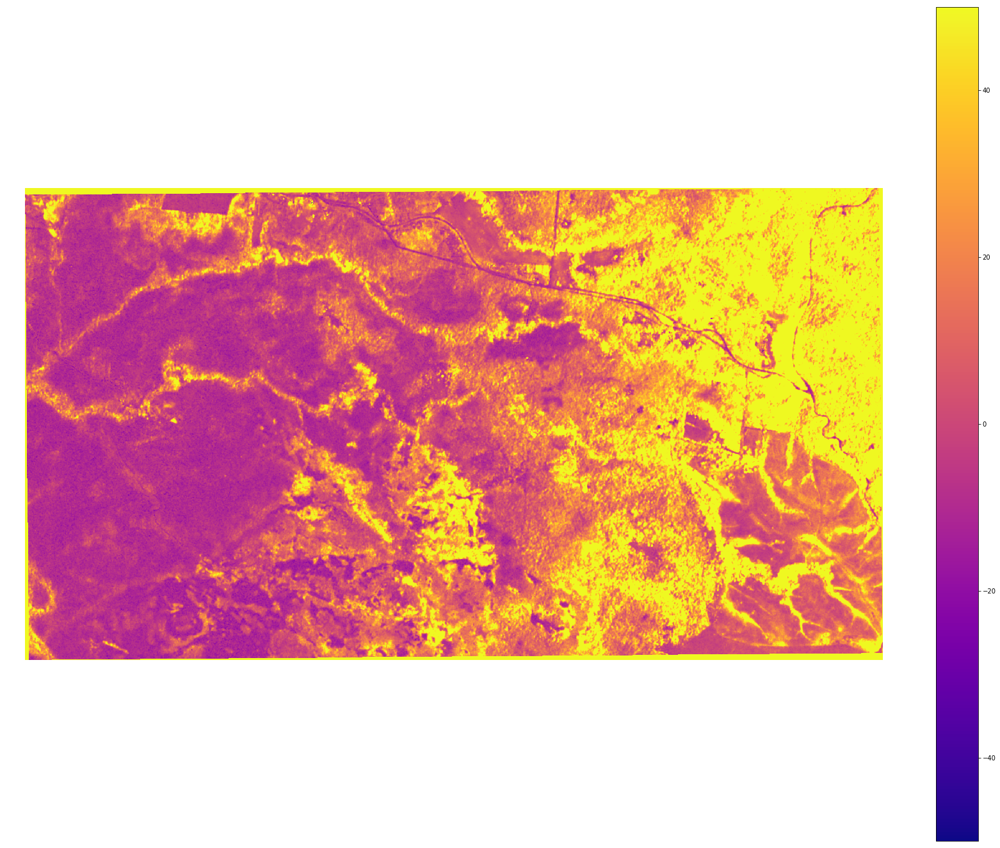

In [120]:
climplot(abs(score_map3)-abs(score_map2),lower=-50,upper=50,cmap="plasma")

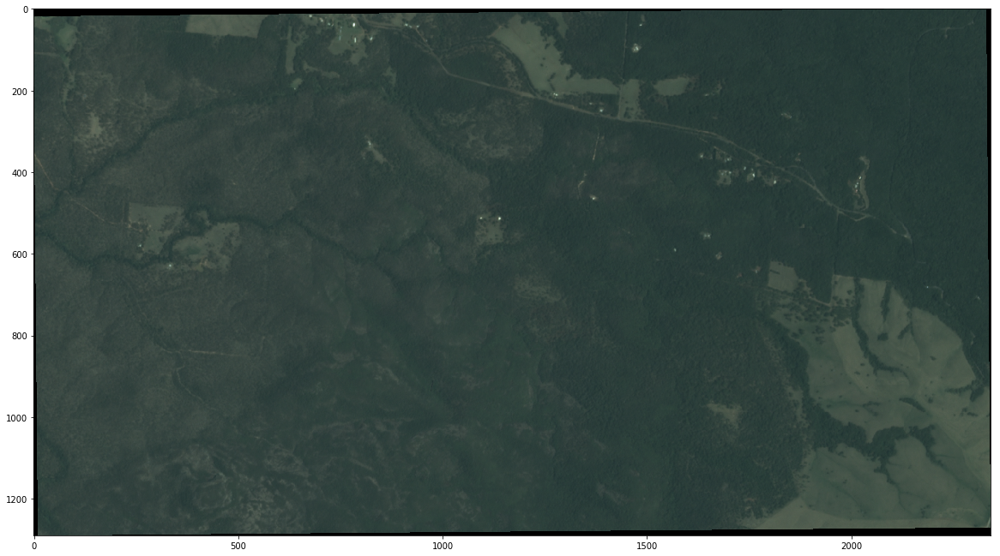

In [92]:
view = imshow(hspy7, (2, 1, 0), figsize=(20,20))

In [23]:
np.save('storn.npy', storn) # save


In [24]:
np.save('score_map1.npy', score_map1)
np.save('score_map2.npy', score_map2)
np.save('score_map3.npy', score_map3)

[-839.19813539 -957.39787341 -273.91868976]
[-21.68369918 -20.33322392 -81.96339354]
[-27.74271693 -42.33851823 -23.00974361]
[-25.75177039 -34.85505052 -22.52352563]
[-22.71546132 -21.13977386 -90.7366444 ]
[-22.02380442 -25.17656557 -29.78721283]
[-31.97378259 -51.617331   -24.14033208]
[-22.44213359 -21.18044949 -83.90729734]

In [129]:
score_map3[23,23]

-112

In [128]:
score_map1.min()

-1351

In [19]:
score_map1.max()

-22

In [20]:
score_map2.min()

-1747

In [21]:
score_map2.max()

-23

In [22]:
score_map3.min()

-1600

In [23]:
score_map3.max()

-21

In [22]:
min([score_map1.min(),score_map2.min(),score_map3.min()])

-1747

In [25]:
storn[23]

[52.936465151065647, 44.721571281854906, 273.91868976380914]

In [29]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm

class MplColorHelper:

  def __init__(self, cmap_name, start_val, stop_val):
    self.cmap_name = cmap_name
    self.cmap = plt.get_cmap(cmap_name)
    self.norm = mpl.colors.Normalize(vmin=start_val, vmax=stop_val)
    self.scalarMap = cm.ScalarMappable(norm=self.norm, cmap=self.cmap)

  def get_rgb(self, val):
    prgb = self.scalarMap.to_rgba(val)
    #print(prgb)
    rgb = [0,0,0]
    rgb[0] = int(prgb[0] * 255)
    rgb[1] = int(prgb[1] * 255)
    rgb[2] = int(prgb[2] * 255)
    #print(rgb)
    return(rgb)
    
vclrs = []
vcol = MplColorHelper('gist_ncar', 0, 406)
for i in range(0,406):
    vclrs.append(vcol.get_rgb(i))

In [26]:
euc = []
noneuc = []
nonveg = []

for i in range(0,len(scorn)):
    arm = np.argmax(scorn[i]) 
    if arm == 0:
        euc.append(scorn[i])
    if arm == 1:
        noneuc.append(scorn[i])
    if arm == 2:
        nonveg.append(scorn[i])

In [27]:
print(len(euc))
print(len(noneuc))
print(len(nonveg))

119916
968441
1932823


In [45]:
ceuc = []
cnoneuc = []
cnonveg = []

for i in range(0,len(storn)):
    arm = np.argmax(storn[i]) 
    if arm == 0:
        ceuc.append(storn[i])
    if arm == 1:
        cnoneuc.append(storn[i])
    if arm == 2:
        cnonveg.append(storn[i])

In [127]:
len(storn)

3021180

In [30]:
storn[23]

[52.936465151065647, 44.721571281854906, 273.91868976380914]

In [31]:
len(ceuc)

1503514

In [ ]:
scorn[23]

In [ ]:
np.argmin(scorn[23])

In [ ]:
len(noneuc)

In [ ]:
len(euc)

In [ ]:
len(nonveg)

In [29]:
seuc = euc[1:100]# * 100
snoneuc = noneuc[1:100]
snonveg = nonveg[1:100]


In [132]:
print(len(ceuc))
print(len(cnoneuc))
print(len(cnonveg))


119916
968441
1932823


In [140]:
sceuc = ceuc[100000:104000]# * 100
scnoneuc = cnoneuc[100000:104000]
scnonveg = cnonveg[100000:104000]

In [141]:
import ternary
fontsize=12
### Scatter Plot
scale = 200
figure, tax = ternary.figure(scale=scale)
figure.set_size_inches(20, 20)
figure.set_dpi(600)

tax.set_title("Ternary Plot of Class Negative Log Likelihoods per NonEucalyptus Pixel", fontsize=20)
tax.right_corner_label("NonEucalypt", fontsize=fontsize)
tax.top_corner_label("Eucalypt", fontsize=fontsize)
tax.left_corner_label("NonVegetation", fontsize=fontsize)
tax.boundary(linewidth=2.0)
tax.gridlines(multiple=25, color="blue")
#tax.figsize = (20,20)
# Plot a few different styles with a legend
#points = storn[1:200]#[:2]#random_points(30, scale=scale)
fontsize=12
offset=-0.02
#tax.scatter(sceuc, marker='s', color='green', label="Eucalyptus")
tax.scatter(scnoneuc, marker='s', color='blue', label="NonEucalyptus")
#tax.scatter(scnonveg, marker='s', color='red', label="NonVegetation")
#tax.left_axis_label("Left label $\\alpha^2$", fontsize=fontsize, offset=offset)
#tax.right_axis_label("Right label $\\beta^2$", fontsize=fontsize, offset=offset)
#tax.bottom_axis_label("Bottom label $\\Gamma - \\Omega$", fontsize=fontsize, offset=offset)
tax.legend()

tax.ticks(axis='lbr', linewidth=1, multiple=25)


#for item in [figure, ax]:
#    item.patch.set_visible(False)


tax.show()

In [142]:
import ternary
fontsize=12
### Scatter Plot
scale = 200
figure, tax = ternary.figure(scale=scale)
figure.set_size_inches(20, 20)
figure.set_dpi(600)

tax.set_title("Ternary Plot of Class Negative Log Likelihoods per Eucalyptus Pixel", fontsize=20)
tax.right_corner_label("NonEucalypt", fontsize=fontsize)
tax.top_corner_label("Eucalypt", fontsize=fontsize)
tax.left_corner_label("NonVegetation", fontsize=fontsize)
tax.boundary(linewidth=2.0)
tax.gridlines(multiple=25, color="blue")
#tax.figsize = (20,20)
# Plot a few different styles with a legend

#points = storn[1:200]#[:2]#random_points(30, scale=scale)
fontsize=12
offset=-0.02
#tax.scatter(sceuc, marker='s', color='green', label="Eucalyptus")
tax.scatter(sceuc, marker='s', color='green', label="Eucalyptus")
#tax.scatter(scnonveg, marker='s', color='red', label="NonVegetation")
#tax.left_axis_label("Left label $\\alpha^2$", fontsize=fontsize, offset=offset)
#tax.right_axis_label("Right label $\\beta^2$", fontsize=fontsize, offset=offset)
#tax.bottom_axis_label("Bottom label $\\Gamma - \\Omega$", fontsize=fontsize, offset=offset)
tax.legend()

tax.ticks(axis='lbr', linewidth=1, multiple=25)


#for item in [figure, ax]:
#    item.patch.set_visible(False)


tax.show()

In [135]:
import ternary
fontsize=12
### Scatter Plot
scale = 200
figure, tax = ternary.figure(scale=scale)
figure.set_size_inches(20, 20)
figure.set_dpi(600)

tax.set_title("Ternary Plot of Class Negative Log Likelihoods per NonVegetation Pixel", fontsize=20)
tax.right_corner_label("NonEucalypt", fontsize=fontsize)
tax.top_corner_label("Eucalypt", fontsize=fontsize)
tax.left_corner_label("NonVegetation", fontsize=fontsize)
tax.boundary(linewidth=2.0)
tax.gridlines(multiple=25, color="blue")
#tax.figsize = (20,20)
# Plot a few different styles with a legend
#points = storn[1:200]#[:2]#random_points(30, scale=scale)
fontsize=12
offset=-0.02
#tax.scatter(sceuc, marker='s', color='green', label="Eucalyptus")
#tax.scatter(scnonveg, marker='s', color='blue', label="NonEucalyptus")
tax.scatter(scnonveg, marker='s', color='red', label="NonVegetation")
#tax.left_axis_label("Left label $\\alpha^2$", fontsize=fontsize, offset=offset)
#tax.right_axis_label("Right label $\\beta^2$", fontsize=fontsize, offset=offset)
#tax.bottom_axis_label("Bottom label $\\Gamma - \\Omega$", fontsize=fontsize, offset=offset)
tax.legend()

tax.ticks(axis='lbr', linewidth=1, multiple=25)


#for item in [figure, ax]:
#    item.patch.set_visible(False)


tax.show()

In [143]:
scnonveg[1:10]

[[23.799044039807146, 24.54855716781174, 52.461411356875935],
 [23.064967407595802, 24.044875515800097, 53.853448743307993],
 [23.132915751650433, 24.246834543954002, 54.12078799262499],
 [23.387277467504383, 24.892535362861544, 53.453629103128371],
 [23.580514909412305, 25.332469627687786, 56.515327015104958],
 [23.602622255534854, 25.222343925225871, 56.108841700594546],
 [23.3999727969486, 24.851076761386274, 57.555550502147078],
 [23.223280998113761, 24.383390290032668, 59.720378227780969],
 [23.353291532890463, 23.720764698435087, 66.768592246759255]]

In [144]:
scnoneuc[1:10]

[[27.534527892586123, 32.073237141312966, 23.143047935790033],
 [25.756501841771161, 29.311723632198934, 22.463451458421311],
 [25.916640196689194, 30.28445412508615, 22.170029802327399],
 [26.396549373701724, 31.527036989305422, 22.109140693895139],
 [25.78092390994798, 30.029507306907398, 22.277523858483217],
 [25.887368961215493, 30.179260447630131, 22.094055144747372],
 [25.946104277335667, 29.979509578262991, 22.074872813164461],
 [25.812146908227518, 29.212251141458573, 22.30506574101334],
 [25.65251002371275, 28.138960361728824, 22.820646792507585]]

In [145]:
sceuc[1:10]

[[31.802421473565168, 25.385916482010426, 29.829617372255647],
 [31.277962916096641, 25.388218108457213, 29.672494248077378],
 [34.595761956298624, 26.913843038840643, 33.277120163422758],
 [32.57432048106719, 25.760215769918673, 30.497212831623454],
 [30.215895201065209, 25.2209424938106, 29.284778385025881],
 [27.191895436982342, 26.569557502083185, 25.137678934737355],
 [27.616844616592289, 26.181494973685528, 24.135472314342461],
 [27.515398965225678, 26.486582220887819, 23.627431041153336],
 [27.642062645315395, 26.905558826499483, 24.476786017525875]]